In [2]:
import os
import sys
sys.path.append(os.path.abspath(".."))

import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'  # For sharper figures, but it takes more time
import matplotlib.cm as cm
import multiprocessing as mp
import scipy as sp
import time
from datetime import datetime

# LISA modules
from lisatools.utils.constants import *
from lisatools.sensitivity  import AE1SensitivityMatrix
from bbhx.waveformbuild import BBHWaveformFD

# Immports for generating simulated LISA data
import noise_generation as noise_generation
from tools.LISASimulator import LISASimulator
from tools.likelihood import get_dh, get_hh
import tools.likelihood as likelihood

# Imports for MCMC
from tools.save_and_load_DE import load_de_results
from tools.time_freq_likelihood import TimeFreqLikelihood
from eryn.ensemble import EnsembleSampler
from eryn.prior import ProbDistContainer, uniform_dist
from eryn.state import State
from scipy.stats import truncnorm
from copy import deepcopy
# Imports for plotting
from chainconsumer import Chain, ChainConsumer, make_sample, Truth
import pandas as pd

# Generating Simulated LISA Data

In [11]:
Tobs = 1.5*YRSID_SI/12
dt = 5.
include_T_channel = False

wave_gen = BBHWaveformFD(amp_phase_kwargs=dict(run_phenomd=False), use_gpu=False)
sim = LISASimulator(Tobs=Tobs, dt=dt, wave_gen=wave_gen, include_T_channel=include_T_channel)

m1 = 3e5
m2 = 1.5e5
a1 = 0.753
a2 = 0.621
dist = 10 * PC_SI * 1e9
phi_ref = 0.0 #np.pi/2
f_ref = 0.0
inc = 0.224
lam = 60*(np.pi/180)
beta = 20*(np.pi/180)
psi = 0
t_ref = Tobs - (24*60*60)
parameters = np.array([m1, m2, a1, a2, dist, phi_ref, f_ref, inc, lam, beta, psi, t_ref])
modes = [(2,2), (2,1), (3,3), (3,2), (4,4), (4,3)]
waveform_kwargs = dict(length=1024, direct=False, fill=True, squeeze=False, modes=modes)

data_t, data_f, f_array, t_array, sens_mat = sim(seed = 42, parameters=parameters, waveform_kwargs=waveform_kwargs)
waveform_kwargs.update(freqs=f_array)

print(f"SNR of the Signal: {sim.SNR_optimal()[0]}")

SNR of the Signal: 1966.0532254156685


# Pre-Merger

In [12]:
hours_before_merger = 14
time_before_merger = hours_before_merger*60*60
cutoff_time = t_ref - time_before_merger
width_of_tref_prior = 20
max_time = t_ref + (width_of_tref_prior - hours_before_merger)*60*60
nperseg = 1414

In [13]:
analysis = TimeFreqLikelihood(data_t=data_t, wave_gen=wave_gen, nperseg=nperseg)
analysis.pre_merger(time_before_merger=time_before_merger, t_ref=t_ref, t_array=t_array)
analysis.get_stft_of_data()
print("Best likelihood (true parameters)= ", analysis.calculate_time_frequency_likelihood(*parameters, waveform_kwargs=waveform_kwargs))

Best likelihood (true parameters)=  -358.70722443600306


# MCMC

In [14]:
# MCMC parameters
nwalkers = 24
ntemps = 4
ndims = 11
nleaves_max = 1
nsteps = 10
perturb_frac = 0.02

param_labels = [
    r"$M_T \, [\mathrm{M_\odot}]$",
    r"$q$",
    r"$a_1$",
    r"$a_2$",
    r"$d_L \, [\mathrm{Gpc}]$",
    r"$\phi_{\mathrm{ref}}$",
    r"$\cos(\iota)$",
    r"$\lambda$",
    r"$\sin(\beta)$",
    r"$\psi$",
    r"$t_{\mathrm{c}} \, [\mathrm{s}]$"
]

In [15]:
def likelihood(x, freqs, TimeFreqLikelihood_object):
    all_parameters = np.zeros(12)
    mT = x[0]
    q = x[1]
    all_parameters[0] = mT / (1 + q)
    all_parameters[1] = mT * q / (1 + q)
    all_parameters[2] = x[2]
    all_parameters[3] = x[3]
    all_parameters[4] = x[4] * PC_SI * 1e9
    all_parameters[5] = x[5]
    all_parameters[6] = f_ref
    all_parameters[7] = np.arccos(x[6])
    all_parameters[8] = x[7]
    all_parameters[9] = np.arcsin(x[8])
    all_parameters[10] = x[9]
    all_parameters[11] = x[10]

    ll = TimeFreqLikelihood_object.calculate_time_frequency_likelihood(
        *all_parameters,
        waveform_kwargs=dict(
        length=1024, 
        direct=False,
        fill=True,
        squeeze=False,
        freqs=freqs,
        modes=modes
        )
    )
    return ll

In [16]:
priors = {"mbh": ProbDistContainer({
        0 : uniform_dist(1e5, 1e6),                  # mT = m1 + m2
        1 : uniform_dist(0.01, 0.99),                # q = m2/m1
        2 : uniform_dist(-1, +1),                    # a1
        3 : uniform_dist(-1, +1),                    # a2
        4 : uniform_dist(1, 50),                     # dist in Mpc
        5 : uniform_dist(0, 2*np.pi),                # phi_ref
        6 : uniform_dist(-1, 1),                     # cos(inc)
        7 : uniform_dist(0.0, 2 * np.pi),            # lam
        8 : uniform_dist(-1.0, 1.0),                 # sin(beta)
        9 : uniform_dist(0.0, np.pi),                # psi
        10: uniform_dist(cutoff_time, max_time),     # t_ref
    })}

periodic = {"mbh": {5: 2 * np.pi,                # phi_ref
                    7: 2 * np.pi,                # lam
                    9: np.pi  }}                 # psi

In [17]:
sampler = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(f_array, analysis),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps = ntemps),
    nleaves_max=dict(mbh = nleaves_max),
    periodic=periodic
)

# Get Results from Differential Evolution

In [29]:
def DE_to_MCMC_params(found_parameters_DE, cutoff_time):
    mT, q, a1, a2, dist_Gpc, phi_ref, cos_inc, lam, sin_beta, psi, t_ref_01 = found_parameters_DE
    mT_exp = np.exp(mT)
    dist_Mpc = dist_Gpc 
    phi_ref = phi_ref % (2*np.pi)
    t_ref = t_ref_01 * (60*60*24) + cutoff_time
    return np.array([mT_exp, q, a1, a2, dist_Mpc, phi_ref, cos_inc, lam, sin_beta, psi, t_ref])

# x0 = load_de_results(filepath='differential_evolution/differential_evolution_results/tf_run_20250924_044928.npz')
# found_parameters_DE = DE_to_MCMC_params(x0['found_parameters'], cutoff_time=cutoff_time)

x0 = np.array([13.0442, 0.480049, 0.820059, 0.262087, 9.93484, 4.12773, 0.971511, 0.843206, 0.390985, 2.12432, 0.577044])
found_parameters_DE = DE_to_MCMC_params(x0, cutoff_time=cutoff_time)
print("Found parameters from DE: ", found_parameters_DE)
# print("SNR of DE result = ", x0['found_snr'])

Found parameters from DE:  [4.62406660e+05 4.80049000e-01 8.20059000e-01 2.62087000e-01
 9.93484000e+00 4.12773000e+00 9.71511000e-01 8.43206000e-01
 3.90985000e-01 2.12432000e+00 3.85782532e+06]


# Generate starting points for mcmc

In [30]:
injection_parameters = np.array([m1+m2, m2/m1, a1, a2, dist / (PC_SI * 1e9), phi_ref, np.cos(inc), lam, np.sin(beta), psi, t_ref])
starting_points = np.zeros(shape=[ntemps, nwalkers, nleaves_max, found_parameters_DE.shape[0]])

# Perturb the injection parameters to create starting points for the walkers
perturb_frac = 0.02

non_periodic_params = [0, 1, 2, 3, 4, 6, 7, 8, 10]  # indices of non-periodic parameters

# For non-periodic parameters, draw from a truncated normal distribution around the injection parameters
for i in non_periodic_params:
    low, high = priors["mbh"].priors[i][1].min_val, priors["mbh"].priors[i][1].max_val
    mu = found_parameters_DE[i]
    sigma = perturb_frac * (high - low)
    a, b = (low - mu) / sigma, (high - mu) / sigma
    starting_points[:, :, :, i] = truncnorm.rvs(a, b, loc=mu, scale=sigma, size=(ntemps, nwalkers, nleaves_max))

# For periodic parameters, draw from a normal distribution around the injection parameters and then wrap around the period
for i, period in periodic["mbh"].items():
    sigma = perturb_frac * period
    perturbed = found_parameters_DE[i] + sigma * np.random.randn(ntemps, nwalkers, nleaves_max)
    starting_points[:, :, :, i] = np.mod(perturbed, period)

starting_state = State({"mbh": starting_points})

Mean of parameter 1 is 0.5
Sigma of parameter 1 is 0.0196


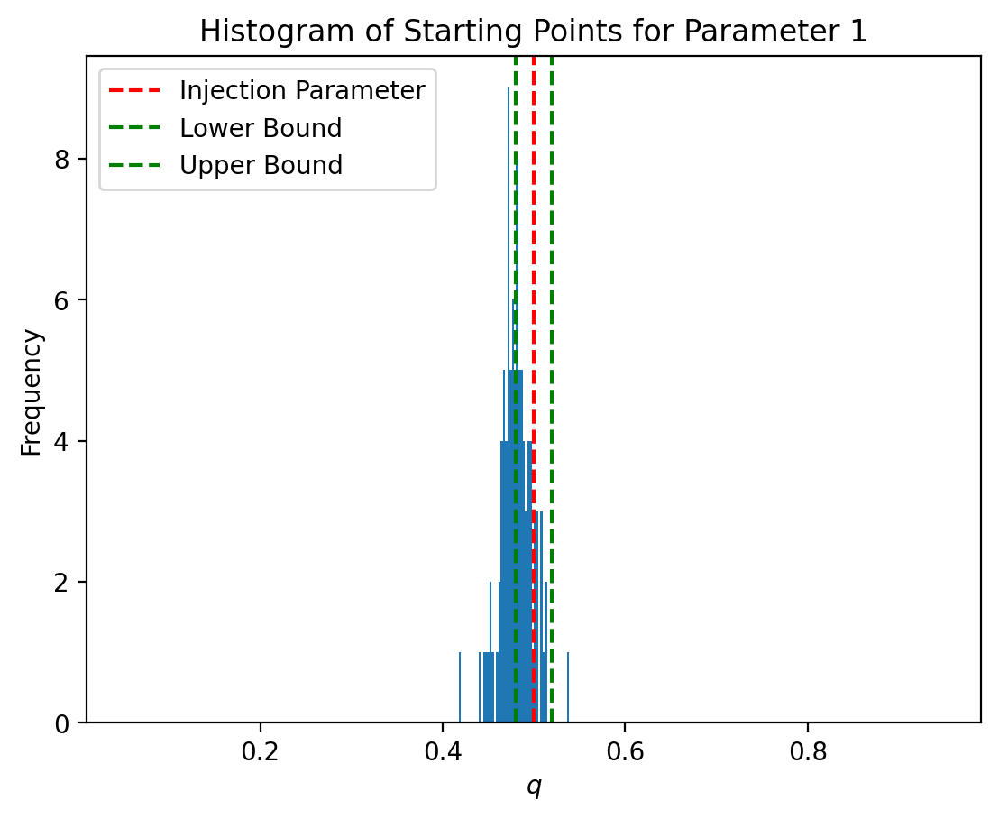

In [31]:
# Plot the histogram of the starting points
index_for_histogram = 1

size_of_prior = priors["mbh"].priors[index_for_histogram][1].max_val - priors["mbh"].priors[index_for_histogram][1].min_val
print("Mean of parameter", index_for_histogram, "is", injection_parameters[index_for_histogram])
print("Sigma of parameter", index_for_histogram, "is", perturb_frac * size_of_prior)

plt.hist(starting_points[:, :, :, index_for_histogram].flatten(), bins=50)
plt.axvline(injection_parameters[index_for_histogram], color='r', linestyle='--', label='Injection Parameter')
plt.axvline(injection_parameters[index_for_histogram] - perturb_frac * size_of_prior, color='g', linestyle='--', label='Lower Bound')
plt.axvline(injection_parameters[index_for_histogram] + perturb_frac * size_of_prior, color='g', linestyle='--', label='Upper Bound')
plt.title(f'Histogram of Starting Points for Parameter {index_for_histogram}')
plt.xlabel(param_labels[index_for_histogram])
plt.xlim(priors["mbh"].priors[index_for_histogram][1].min_val, priors["mbh"].priors[index_for_histogram][1].max_val)
plt.ylabel('Frequency')
plt.legend(loc='upper left')
plt.show()

In [32]:
start_time = time.time()
sampler.run_mcmc(starting_state, nsteps=nsteps, progress=True)
end_time = time.time()
print(f"MCMC run completed in {end_time - start_time} seconds.")

100%|██████████| 10/10 [05:59<00:00, 35.98s/it]

MCMC run completed in 400.71701526641846 seconds.


# Plotting

Parameter $q$ in chain MCMC Results is not constrained
Parameter $a_2$ in chain MCMC Results is not constrained


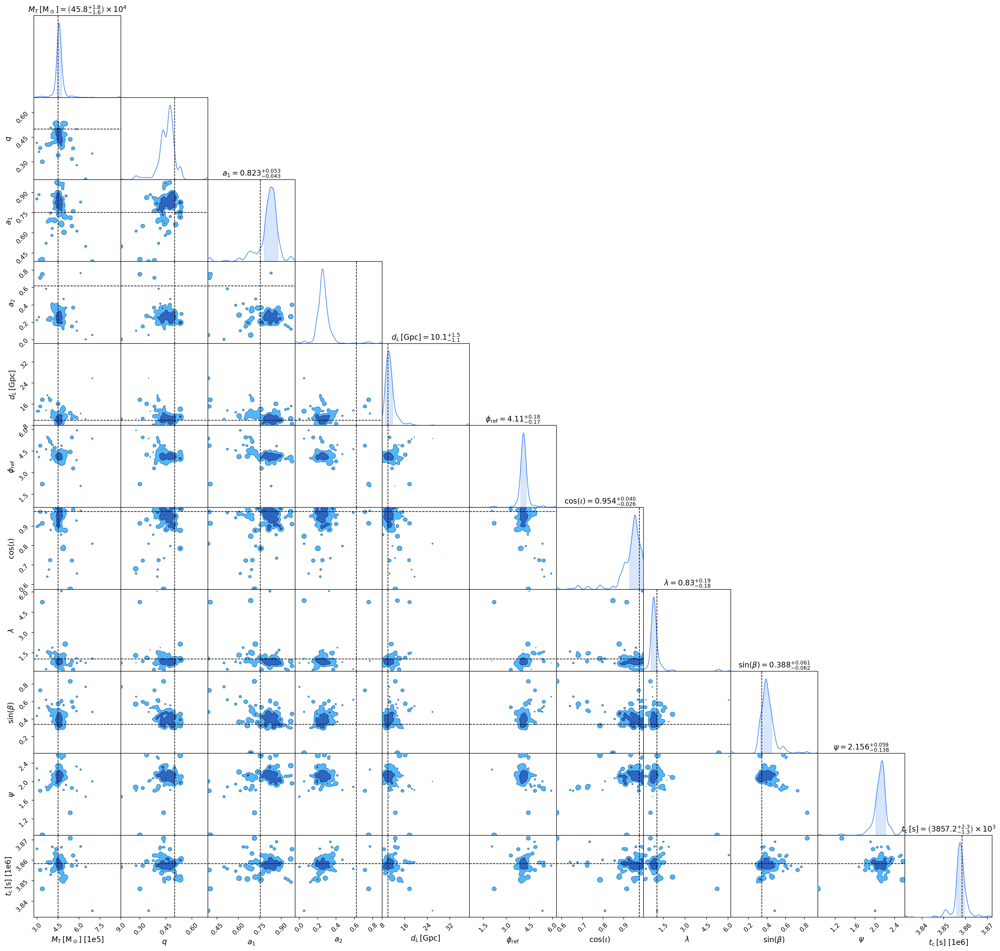

In [33]:
from chainconsumer import Chain, ChainConsumer, make_sample, Truth
import pandas as pd

mcmc_results = sampler.get_chain()["mbh"]
#np.save(f"mcmc_results/useless_laptop_run.npy", mcmc_results)

samples = mcmc_results[:, 0].reshape(-1, 11)
df = pd.DataFrame(samples, columns=param_labels)

burn_in_2 = 100                           # Remove burn-in samples if needed
df_post_burnin = df.iloc[burn_in_2:]

injection_parameters = np.array([m1+m2, m2/m1, a1, a2, dist / (PC_SI * 1e9), phi_ref, np.cos(inc), lam, np.sin(beta), psi, t_ref])
c = ChainConsumer() 
c.add_chain(Chain(samples=df_post_burnin, name="MCMC Results"))
c.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
fig = c.plotter.plot()


In [ ]:
#df.to_pickle("first_working_mcmc_1500.pkl")
#df = pd.read_pickle("first_working_mcmc_1500.pkl")

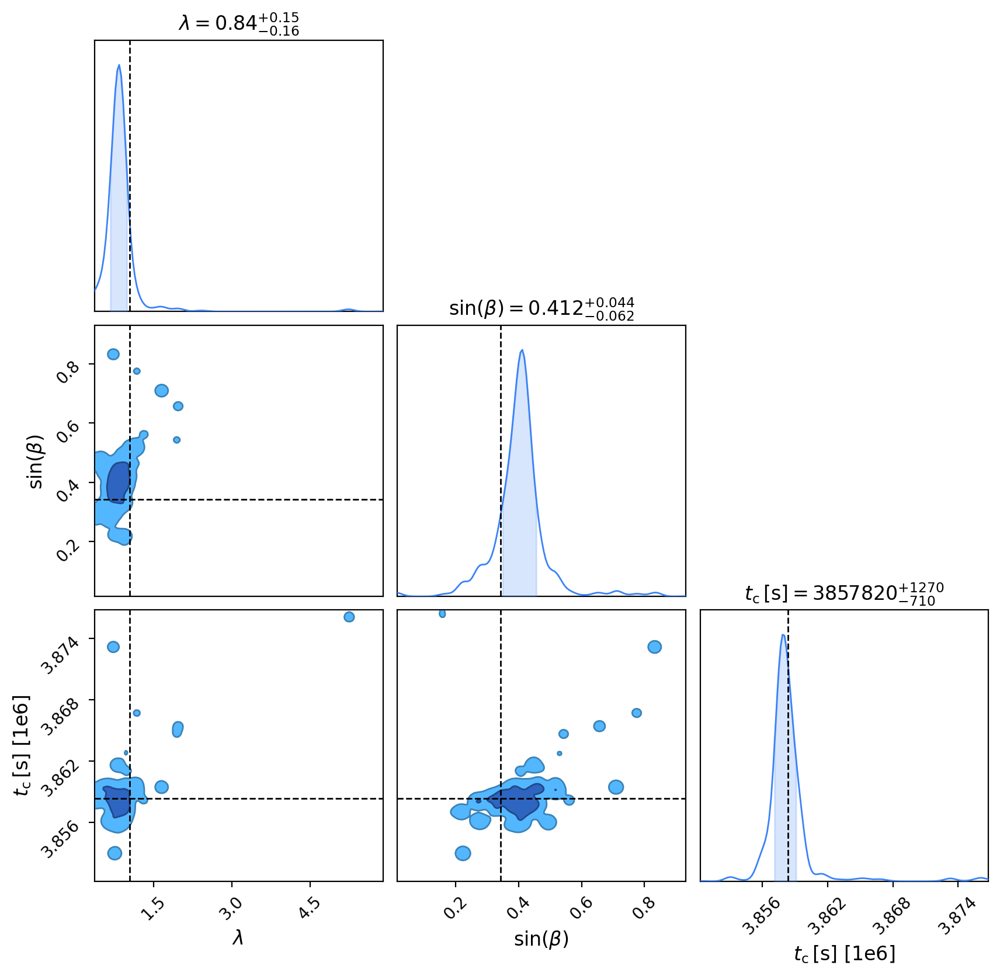

In [46]:
from chainconsumer import Chain, ChainConsumer, make_sample, Truth
import pandas as pd

new_df = df[["$\\lambda$", "$\\sin(\\beta)$", "$t_{\\mathrm{c}} \\, [\\mathrm{s}]$"]]

new_injection_parameters = np.array([lam, np.sin(beta), t_ref])
new_c = ChainConsumer() 
new_c.add_chain(Chain(samples=new_df, name="MCMC Results"))
new_c.add_truth(Truth(location={param_labels[7]: new_injection_parameters[0],
                                param_labels[8]: new_injection_parameters[1],
                                param_labels[10]: new_injection_parameters[2]}))
fig = new_c.plotter.plot()

# Burn in

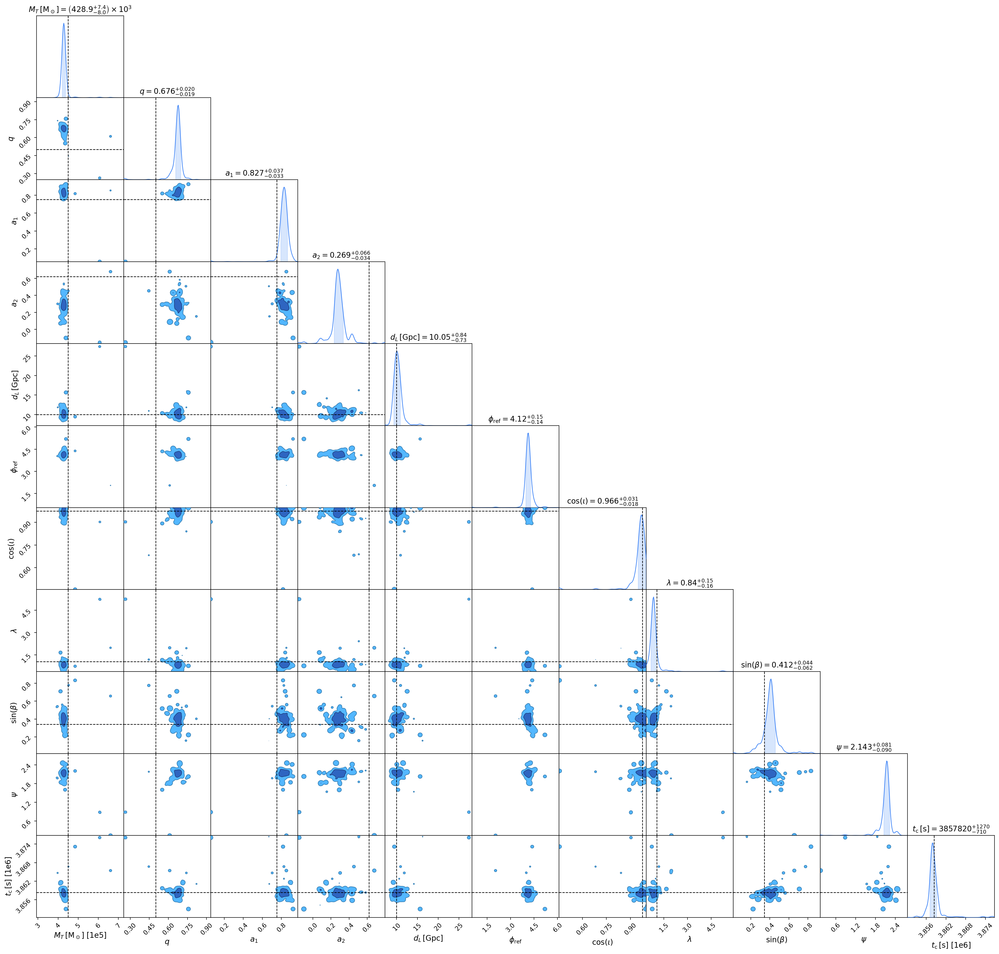

In [49]:
burn_in = 30
df_burnin = df.iloc[burn_in:]

c_burn_in = ChainConsumer() 
c_burn_in.add_chain(Chain(samples=df_burnin, name="MCMC Results"))
c_burn_in.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
fig_burn_in = c_burn_in.plotter.plot()

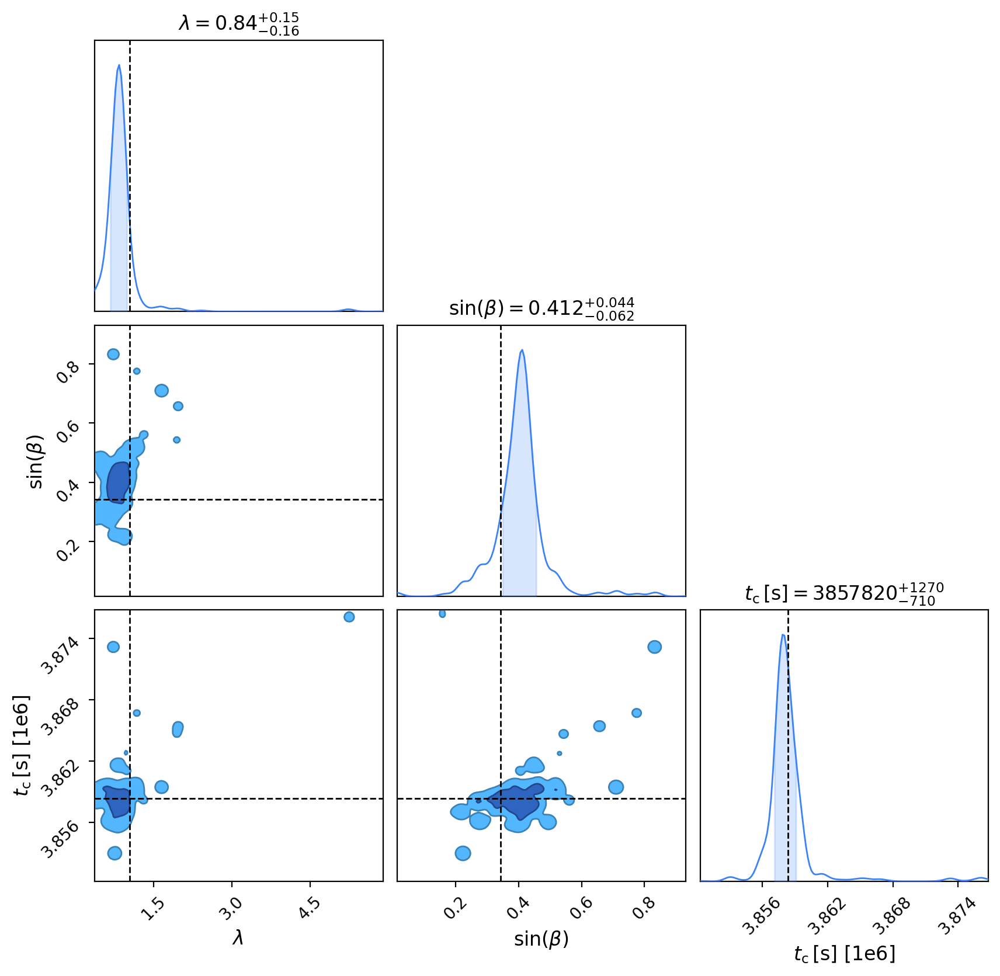

In [50]:
df_burnin_lam_beta_tc = df_burnin[["$\\lambda$", "$\\sin(\\beta)$", "$t_{\\mathrm{c}} \\, [\\mathrm{s}]$"]]
new_c_lam_beta_t = ChainConsumer() 
new_c_lam_beta_t.add_chain(Chain(samples=df_burnin_lam_beta_tc, name="MCMC Results"))
new_c_lam_beta_t.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
fig = new_c_lam_beta_t.plotter.plot()

Text(0.5, 0, 'Step')

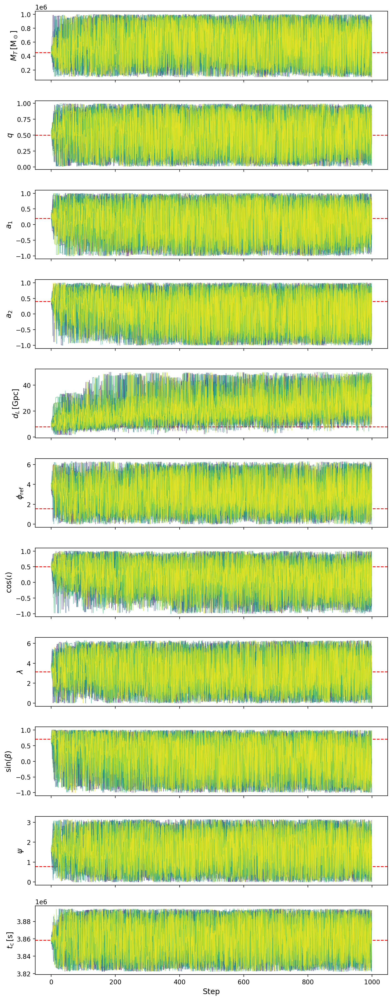

In [85]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm

plotting_walkers_range = nwalkers
colors = cm.viridis(np.linspace(0, 1, plotting_walkers_range))

fig, ax = plt.subplots(ndims, 1, sharex=True, figsize=(10, 2.5 * ndims))
fig.subplots_adjust(hspace=0.3)


for i in range(ndims):
    ax[i].axhline(injection_parameters[i], color='red', linestyle='--', linewidth=1.2, label="True value")
    for walk in range(plotting_walkers_range):
        ax[i].plot(mcmc_results[:, 0, walk, :, i].flatten(), color=colors[walk], alpha=0.6, linewidth=0.8)
    #ax[i].axhline(starting_points[0, walk, :, i], color='blue', linestyle='--', linewidth=1.2, label="Starting point of the last walker")

    ax[i].set_ylabel(param_labels[i], fontsize=12)
    #ax[i].legend(loc='upper right', fontsize=10)

ax[-1].set_xlabel("Step", fontsize=12)


Text(0, 0.5, 'Log-likelihood')

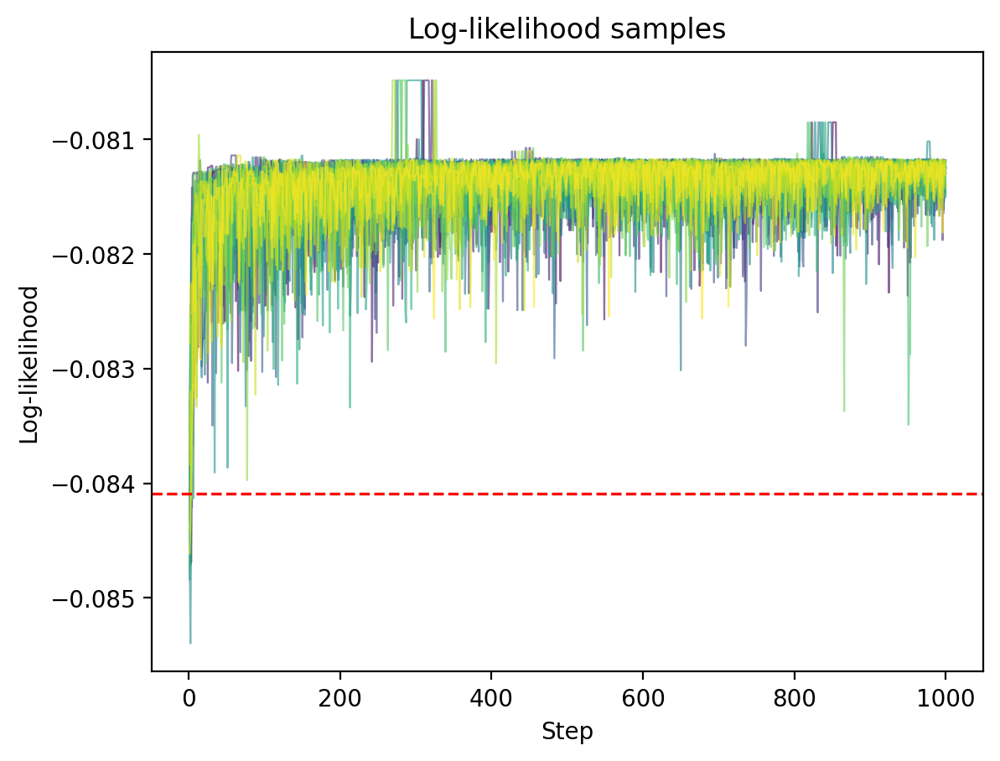

In [86]:
log_like_samples = sampler.get_log_like() 

for i in range(nwalkers):
    plt.plot(np.arange(1, log_like_samples.shape[0]+1), log_like_samples[:,0,i]/analysis.dt, label=f"Walker {i+1}", color=colors[i], alpha=0.6, linewidth=0.8)

plt.axhline(analysis.calculate_time_frequency_likelihood(*parameters, waveform_kwargs=waveform_kwargs) / analysis.dt , 
            color='red', linestyle='--', linewidth=1.2, label="Likelihood of Injection Parameters")

plt.title("Log-likelihood samples")
plt.xlabel("Step")
plt.ylabel("Log-likelihood")
#plt.xticks(nsteps)
#plt.ylim(-1000, 0)
#plt.legend()


In [ ]:
"""import os
os.system("say 'Computation is done!'")"""

Parameter $a_1$ in chain MCMC Results is not constrained
Parameter $\phi_{\mathrm{ref}}$ in chain MCMC Results is not constrained
Parameter $\sin(\beta)$ in chain MCMC Results is not constrained
Parameter $\psi$ in chain MCMC Results is not constrained


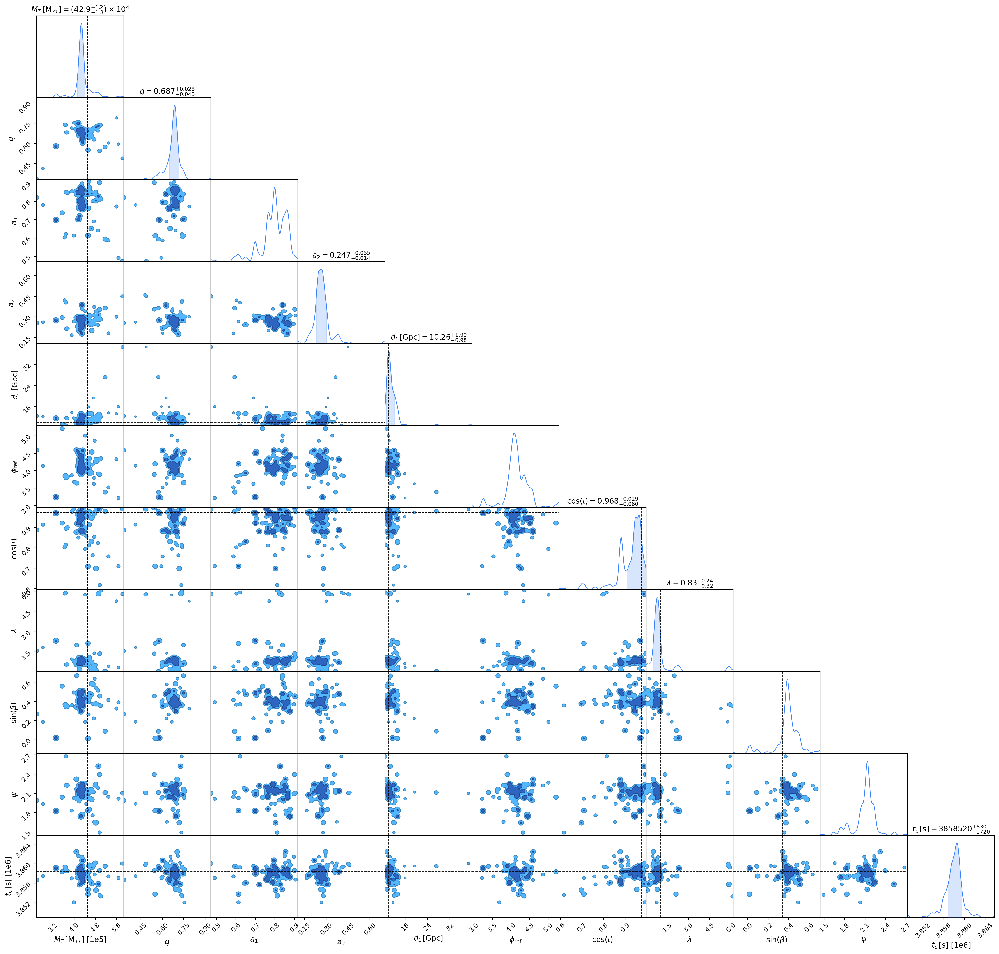

In [87]:
from chainconsumer import Chain, ChainConsumer, make_sample, Truth
import pandas as pd
loaded_df_euler = pd.read_pickle("mcmc_results/mcmc_run_14_hours_02.pkl")

injection_parameters = np.array([m1+m2, m2/m1, a1, a2, dist / (PC_SI * 1e9), phi_ref, np.cos(inc), lam, np.sin(beta), psi, t_ref])
chain_euler = ChainConsumer() 
chain_euler.add_chain(Chain(samples=loaded_df_euler, name="MCMC Results"))
chain_euler.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
fig_euler = chain_euler.plotter.plot()



In [78]:
df_01_np = df_01.to_numpy()
# df_01_np.shape
param_labels

['$M_T \\, [\\mathrm{M_\\odot}]$',
 '$q$',
 '$a_1$',
 '$a_2$',
 '$d_L \\, [\\mathrm{Gpc}]$',
 '$\\phi_{\\mathrm{ref}}$',
 '$\\cos(\\iota)$',
 '$\\lambda$',
 '$\\sin(\\beta)$',
 '$\\psi$',
 '$t_{\\mathrm{c}} \\, [\\mathrm{s}]$']

# 14 hours before merger

In [ ]:
import corner
nparams = len(param_labels)
fig , axs = plt.subplots(nparams,nparams, figsize=(2*nparams, 2*nparams))
for ax in axs.flatten('C'):
    ax.tick_params(which='both',labelsize=13)

## for all ax tick labels, max significant digits = 3, need to set this with rcparams
for i in range(nparams):
    axs[i,i].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))
    axs[i,i].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.3f}'))

## for all axes when i==j, draw dashed vline at injection and for i<=j draw dashed vline and hline at injections
for i in range(nparams):
    for j in range(nparams):
        if i==j:
            axs[i,j].axvline(injection_parameters[i], color='k', linestyle=(1,(5,1)), linewidth=1.2)
        if i>j:
            axs[i,j].axvline(injection_parameters[j], color='k', linestyle=(1,(5,1)), linewidth=1.2)
            axs[i,j].axhline(injection_parameters[i], color='k', linestyle=(1,(5,1)), linewidth=1.2)

## list of fractional/decimal values of 1, 2 and 3 sigma
levels = [0.6827, 0.9545, 0.9973]

corner.corner(
                df_01.values, 
                labels=param_labels, 
                fig=fig,
                show_titles=True,
                levels=levels,
                color = 'blue',
                alpha=0.6,
                smooth=1,
                labelpad=0.1,
                quantiles=[0.16, 0.5, 0.84],
                label_kwargs={"fontsize":13},
                bins=50,
                fill_contours=True,
                plot_datapoints=False,
                max_n_ticks=3,
                smooth1d=1
                # hist_kwargs={"density": True, "linewidth": 1.5, "histtype": "stepfilled", "alpha": 0.7, },
                    );

NameError: name 'param_labels' is not defined

In [182]:
skyloc_2d_marg_labels = df_01[["$\\lambda$", "$\\sin(\\beta)$"]]
skyloc_2d_marg_params = df_01_np[:, [7, 8]]
skyloc_2d_marg_params[:, 1] = np.arcsin(skyloc_2d_marg_params[:, 1])

In [183]:
### Create an aitoff projection map and plot on the sky
import astropy.coordinates as coord
import astropy.units as u
from astropy.io import fits
from ligo.skymap import plot, kde, postprocess, io
import healpy as hp

In [184]:
skypos_ = kde.Clustered2DSkyKDE(skyloc_2d_marg_params, jobs=8)

  0%|          | 0/200 [00:00<?, ?it/s]

In [185]:
heatmap = skypos_.as_healpix()
io.write_sky_map("skymap_lam_beta_tc.fits", heatmap, nest=None)

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

  0%|          | 0/3072 [00:00<?, ?it/s]

In [186]:
skymap, metadata = io.read_sky_map("skymap_lam_beta_tc.fits", nest=None)
nside = hp.npix2nside(len(skymap))

deg2perpix = hp.nside2pixarea(nside, degrees=True)
probperdeg2 = skymap / deg2perpix

In [226]:
pix_scale = 0.1 * u.deg
smooth = 5 * pix_scale

In [234]:
## single colour alpha gradient cmap
cmap = plt.get_cmap('viridis', 3)  # 'viridis
colors = [cmap(i) for i in range(cmap.N)]

/opt/anaconda3/envs/lisa_env/lib/python3.12/site-packages/astropy/visualization/wcsaxes/core.py:258: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = super().contour(*args, **kwargs)


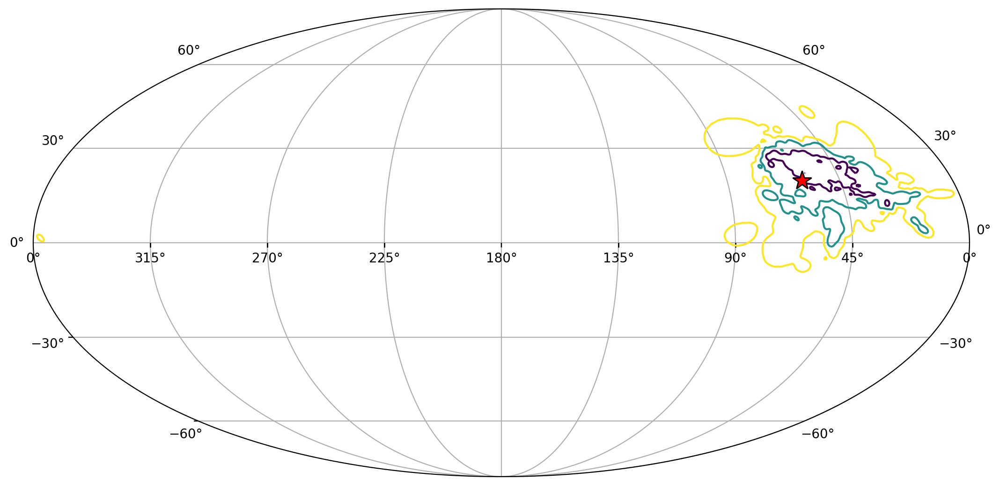

In [ ]:
plt.figure(figsize=(10, 6))
center = coord.SkyCoord(
    dec = injection_parameters[8] * u.rad,
    ra = injection_parameters[7] * u.rad
)

ax = plt.axes(
    [0, 0, 1, 1],
    projection = "astro degrees mollweide",
    
)

ax.grid()

confidence_levels = 100 * postprocess.find_greedy_credible_levels(skymap)
contours = ax.contour_hpx(
    (confidence_levels, 'ICRS'),
    nested = metadata['nest'],
    linewidth = 3,
    levels = [68.27, 95.45, 99.73], 
    smooth = smooth,
    colors = colors,
)

ax.plot_coord(center, '*', markeredgecolor='k', color = 'red', markersize=15,)


Parameter $a_1$ in chain MCMC Results is not constrained


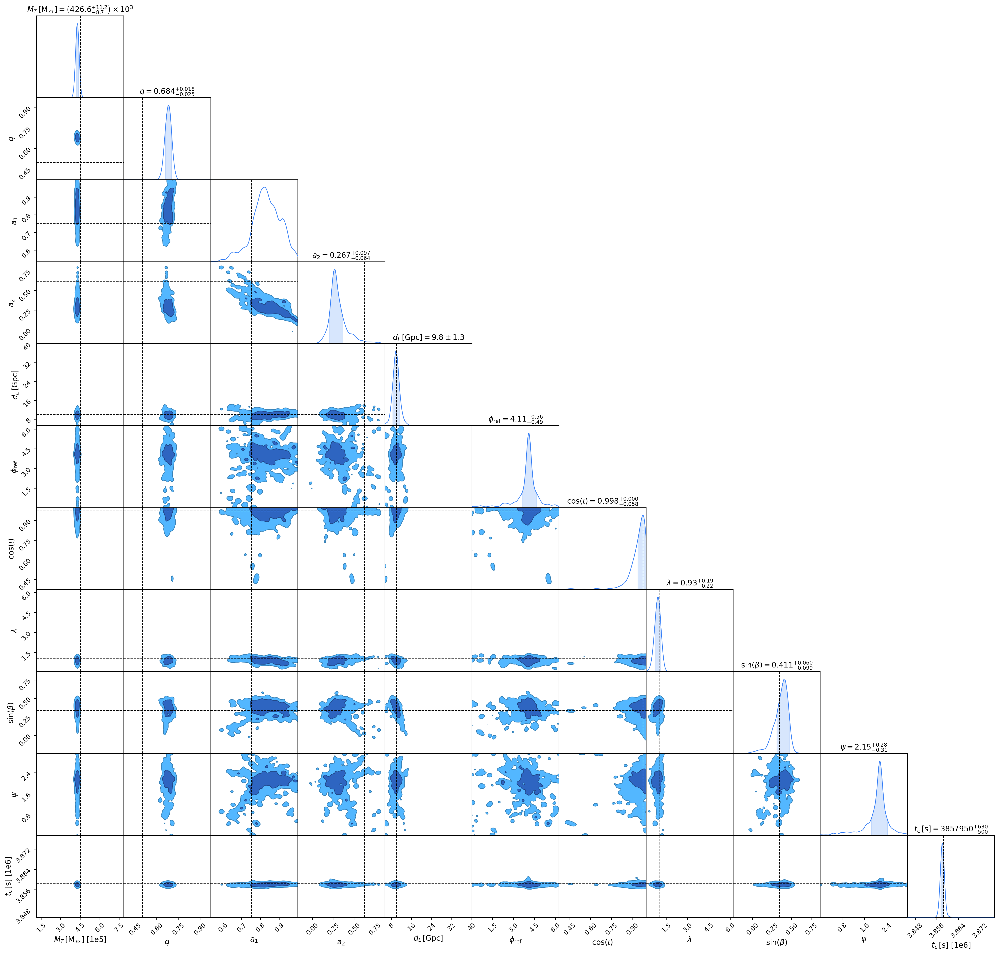

In [93]:
df_01 = pd.read_pickle("mcmc_results/mcmc_run_14_hours_02.pkl")
injection_parameters = np.array([m1+m2, m2/m1, a1, a2, dist / (PC_SI * 1e9), phi_ref, np.cos(inc), lam, np.sin(beta), psi, t_ref])
c_01 = ChainConsumer() 
c_01.add_chain(Chain(samples=df_01, name="MCMC Results"))#, kde=1),)
c_01.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
#c_01.set_plot_config(             
            #    shade=True,            
            #     bar_shade=False,                         
            #    shade_alpha=[0.7,0.8],             
            #    sigmas=[1,2,3],             
            #    tick_font_size=12,             
            #    label_font_size=20,             
            #    max_ticks=4,             
            #    diagonal_tick_labels=False)
fig_01 = c_01.plotter.plot()

Parameter $a_1$ in chain MCMC Results is not constrained


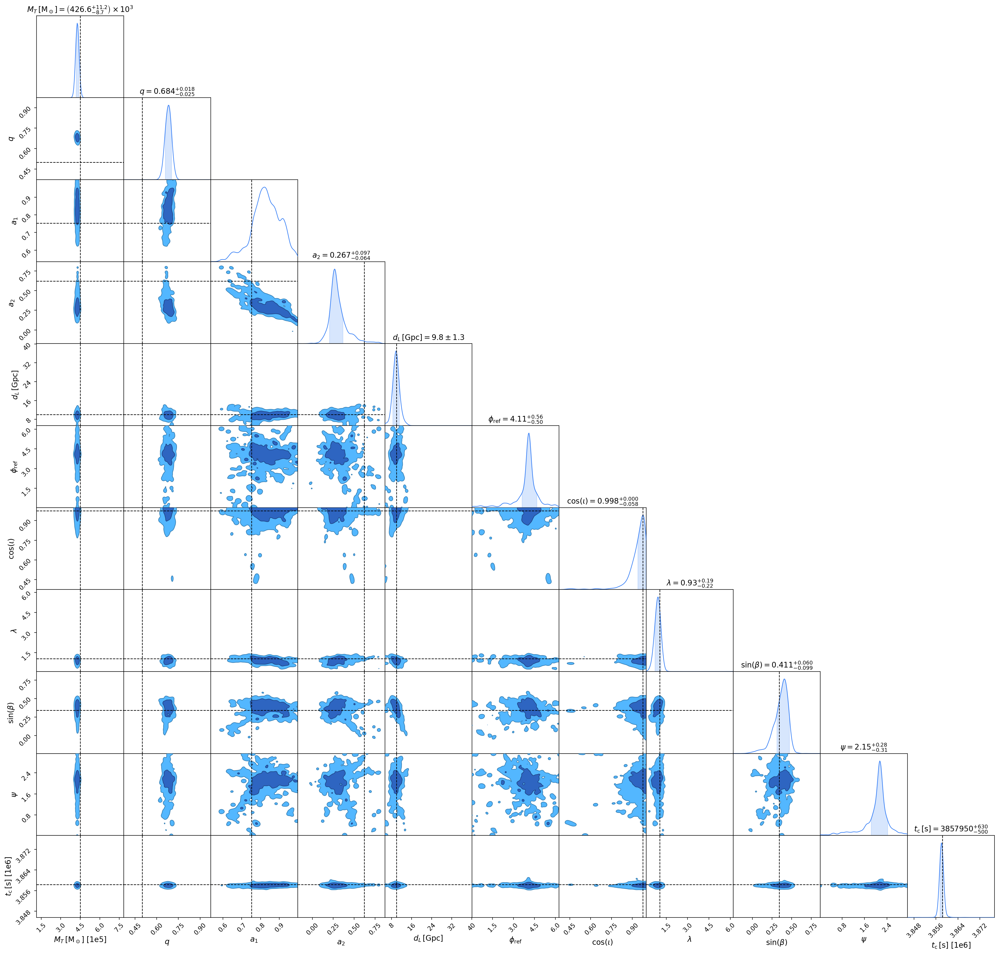

In [55]:
burn_in = 100
df_01_burnin = df_01.iloc[burn_in:]

c_01_burn_in = ChainConsumer() 
c_01_burn_in.add_chain(Chain(samples=df_01_burnin, name="MCMC Results"))
c_01_burn_in.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
fig_01_burn_in = c_01_burn_in.plotter.plot()

In [46]:
df_01[param_labels[1]].values

array([0.6378794 , 0.69254344, 0.68266411, ..., 0.67409802, 0.67836904,
       0.6750358 ], shape=(36000,))

Text(0.5, 0, 'Step')

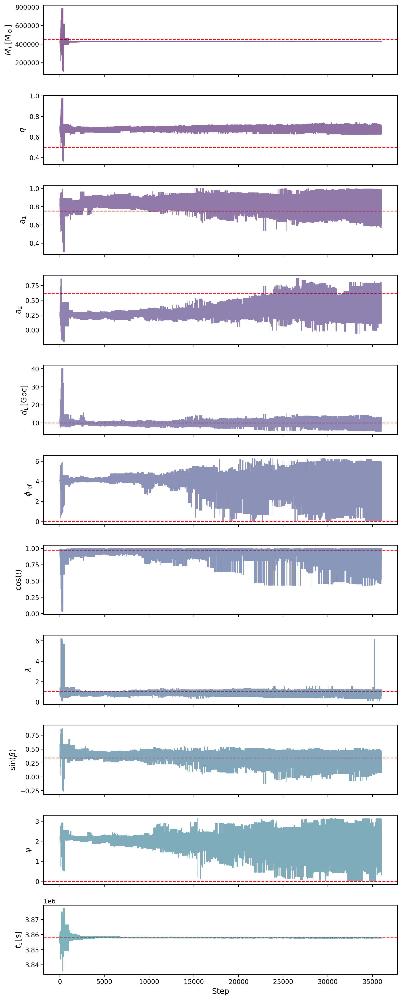

In [48]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm

plotting_walkers_range = nwalkers
colors = cm.viridis(np.linspace(0, 1, plotting_walkers_range))

fig, ax = plt.subplots(ndims, 1, sharex=True, figsize=(10, 2.5 * ndims))
fig.subplots_adjust(hspace=0.3)


for i in range(ndims):
    ax[i].axhline(injection_parameters[i], color='red', linestyle='--', linewidth=1.2, label="True value")
    ax[i].plot(df_01[param_labels[i]].values, color=colors[i], alpha=0.6, linewidth=0.8)

    ax[i].set_ylabel(param_labels[i], fontsize=12)

ax[-1].set_xlabel("Step", fontsize=12)


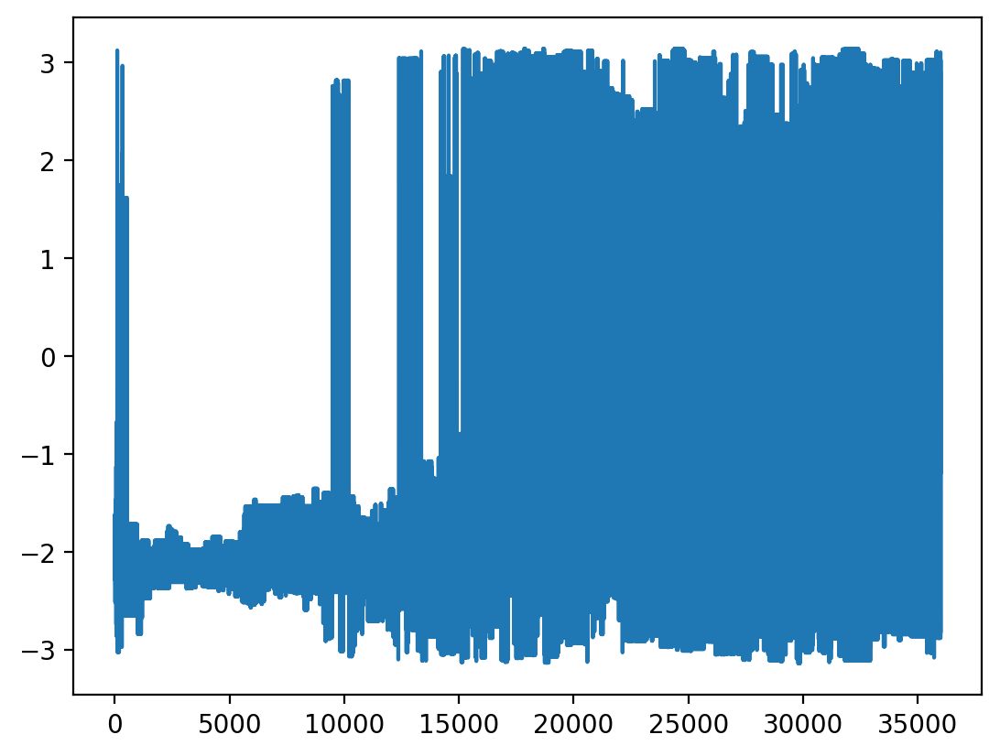

In [53]:
phi_mcmc_array = df_01[param_labels[5]].values
phi_mcmc_array = (phi_mcmc_array + np.pi) % (2 * np.pi) - np.pi
plt.plot(phi_mcmc_array)

In [59]:
mcmc_array = np.load("mcmc_results/mcmc_run_14_hours_02.npy")
mcmc_array
samples = mcmc_array[:, 0].reshape(-1, 11)
df = pd.DataFrame(samples, columns=param_labels)
df

,"$M_T \, [\mathrm{M_\odot}]$",$q$,$a_1$,$a_2$,"$d_L \, [\mathrm{Gpc}]$",$\phi_{\mathrm{ref}}$,$\cos(\iota)$,$\lambda$,$\sin(\beta)$,$\psi$,"$t_{\mathrm{c}} \, [\mathrm{s}]$"
0,427815.090252,0.677581,0.816312,0.266471,9.887613,4.124022,0.971797,0.838716,0.389810,2.128813,3.857747e+06
1,427556.463685,0.679339,0.820396,0.262051,9.928394,4.125094,0.971691,0.844126,0.393538,2.121458,3.857814e+06
2,427901.990540,0.679297,0.820082,0.261338,9.965342,4.134535,0.970555,0.841965,0.389796,2.126235,3.857816e+06
3,427540.803276,0.678076,0.823165,0.262749,9.915274,4.128535,0.972725,0.842236,0.392462,2.125900,3.857723e+06
4,428138.132877,0.677414,0.821485,0.261703,9.908914,4.125697,0.973758,0.841462,0.391645,2.125438,3.857884e+06
...,...,...,...,...,...,...,...,...,...,...,...
355,427359.002772,0.683950,0.813687,0.256626,9.885799,4.131083,0.971735,0.832287,0.392035,2.123000,3.857900e+06
356,428024.931907,0.676779,0.831019,0.251311,10.212987,4.205310,0.969048,0.893964,0.382934,2.096601,3.857747e+06
357,427553.292960,0.678590,0.817890,0.241165,9.834643,4.097165,0.962283,0.855898,0.400268,2.116057,3.857893e+06
358,427837.686156,0.677530,0.817289,0.261282,9.897547,4.123078,0.970809,0.843771,0.390245,2.126253,3.857810e+06


In [ ]:
file_name = "20250915_141623.npz"
bruh = np.load(f"mcmc_results/mcmc_run_{file_name}.npy")

samples_bruh = bruh[:, 0].reshape(-1, 11)
df_bruh = pd.DataFrame(samples_bruh, columns=param_labels)
c_bruh = ChainConsumer()
c_bruh.add_chain(Chain(samples=df_bruh, name="MCMC Results"))
c_bruh.add_truth(Truth(location = dict(zip(param_labels[:11], injection_parameters[:11]))))
fig_bruh = c_bruh.plotter.plot()